In [1]:
"""Example for plotting gradient data"""
import os.path as op
from glob import glob
import pickle

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import ptitprince as pt

from utils import plot_gradient

In [2]:
# Global Variable
data_dir = op.abspath("../data")
results_dir = op.abspath("../results")

# Visualize Silhouette Scores

Mean silhouette scores were visualized to determine relative performance across percentile-based, 
k-means-based, and KDE-based segmentations, with the highest mean silhouette score representing 
the “best” relative performance.

In [3]:
silhouette_scores_df = pd.read_csv(op.join(results_dir, "gradient_segmentation", "silhouette_scores.csv"))
n_score = silhouette_scores_df.shape[0]

mean_scores_df = pd.DataFrame()
mean_scores_df["segment_sizes"] = silhouette_scores_df["segment_sizes"].tolist()
segmentation_lst =  ["PCT"] * n_score + ["KMeans"] * n_score + ["KDE"] * n_score
silhouette_score_lst = silhouette_scores_df["percentile"].tolist() + silhouette_scores_df["kmeans"].tolist() + silhouette_scores_df["kde"].tolist()

mean_scores_df = pd.concat([mean_scores_df] * 3)
mean_scores_df["segmentation"] = segmentation_lst
mean_scores_df["silhouette_score"] = silhouette_score_lst
mean_scores_df = mean_scores_df.reset_index()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


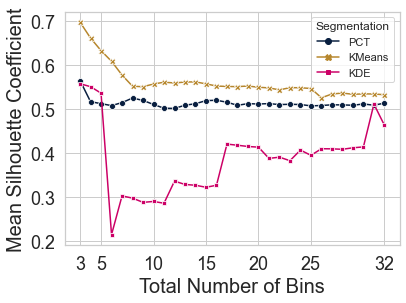

In [32]:
sns.set(style="whitegrid")
plt.figure(figsize=(6,4.3))

pal = ["#081E3F", "#B6862C", "#CC0066"]
hue_order = ["PCT", "KMeans", "KDE"]

ax = sns.lineplot(
    data=mean_scores_df,
    x="segment_sizes", y="silhouette_score", hue="segmentation", style="segmentation",
    markers=True, dashes=False, hue_order=hue_order,
    palette=pal
)
ax.set_xlabel('Total Number of Bins', fontsize=20)
plt.xticks(fontsize=18)
ax.set_xticks([3, 5, 10, 15, 20, 25, 32])
ax.set_xticklabels([3, 5, 10, 15, 20, 25, 32], fontsize=18)
ax.set_ylabel('Mean Silhouette Coefficient', fontsize=20)
plt.yticks(fontsize=18)
# ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
ax.legend(title='Segmentation')
plt.savefig(op.join(results_dir, "gradient_segmentation", "Figures", "silhouette_scores.eps"), format="eps", bbox_inches="tight")

# Visualize Silhouette Samples

In [5]:
# Get samples and labels data
samples_arrays = []
labels_lst = []
for method in ["percentile", "kmeans", "kde"]:
    samples_arr_fn = op.join(results_dir, "gradient_segmentation", method, f"{method}_samples.npy")
    samples_arrays.append(np.load(samples_arr_fn))

    results_dict_fn = op.join(results_dir, "gradient_segmentation", method, f"{method}_results.pkl")
    results_dict_file = open(results_dict_fn, "rb")
    results_dict = pickle.load(results_dict_file)
    results_dict_file.close() 
    labels_lst.append(results_dict["labels"])

In [6]:
# Create a pandas dataframe (violin_df) for violin plots.
min_n_segments = 3
n_segments = 30
segment_sizes = np.arange(min_n_segments, n_segments + min_n_segments)

violin_df = pd.DataFrame()
segment_sizes_lst = []
sample_scores_lst = []
segmentation_names_lst = [] 
for samples_arr in samples_arrays:
    for segm_i in range(n_segments):
        segment_sizes_lst.append([str(segment_sizes[segm_i])] * samples_arr.shape[1])
        sample_scores_lst.append(samples_arr[segm_i, :])

n_sample_scores = n_segments * samples_arr.shape[1]
segmentation_names_lst = ["PCT"] * n_sample_scores + ["KMeans"] * n_sample_scores + ["KDE"] * n_sample_scores

violin_df["segment_sizes"] = np.hstack(segment_sizes_lst)
violin_df["segmentation"] = segmentation_names_lst
violin_df["sample_scores"] = np.hstack(sample_scores_lst)

## Visualize Cluster Balance

This plot is useful for determining cluster imbalance. We displays the silhouette 
coefficient for each sample per cluster, to visualize which clusters are dense and which are not.

In [ ]:
# sns.set_theme(style="white")
sns.set(style="whitegrid")

# Create a subplot with 1 row and 2 columns
# fig, axes_tpl = plt.subplots(segment_sizes.shape[0], 3)
# fig.set_size_inches(18, 90)

for segm_i, segment_size in enumerate(segment_sizes):
    fig, axes_tpl = plt.subplots(1, 3)
    fig.set_size_inches(15, 5)
    for method_i, method in enumerate(["Percentile", "KMeans", "KDE"]):
        # temp_axis = axes_tpl[segm_i, method_i]
        temp_axis = axes_tpl[method_i]

        norm = plt.Normalize(0, segment_size-1)
        color = cm.get_cmap("viridis")
        y_lower = 10
        y_min, y_max = -1, 1
        for cluster_i in range(segment_size):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = samples_arrays[method_i][segm_i, labels_lst[method_i][segm_i] == cluster_i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            
            # color = cm.nipy_spectral(float(cluster_i) / segment_size)
            """
            temp_axis.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color(norm(cluster_i)),
                edgecolor=color(norm(cluster_i)),
                alpha=0.8,
            )
            """
            temp_axis.fill_between(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color(norm(cluster_i)),
                edgecolor=color(norm(cluster_i)),
                alpha=1,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            # temp_axis.text(-0.05, y_lower + 0.5 * size_cluster_i, str(cluster_i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        # y_min, y_max = np.max([samples_arrays[method_i][segm_i, :].min(), y_min]), np.min([samples_arrays[method_i][segm_i, :].max(), y_max])
        yticks = np.arange(-1, 1.5, 0.5)
        temp_axis.set_yticks(yticks)
        # if method_i != 0:
        temp_axis.axes.yaxis.set_ticklabels([])

        """
        if segm_i == 0:
            temp_axis.set_title(f"Silhouette plot for {method} clustering.")
        if method_i == 0:
            temp_axis.set_ylabel(f"Number of segments = {segment_size}")
        if segm_i == segment_sizes.shape[0]-1:
            temp_axis.set_xlabel("Silhouette coefficient values")
        """

        # The vertical line for average silhouette score of all the values
        temp_axis.axhline(y=silhouette_scores_df[method.lower()][segm_i], color="black", linestyle="--")

        temp_axis.set_xticks([])  # Clear the yaxis labels / ticks
    
    # yticks = np.arange(round(y_min,1)-0.1, round(y_max,1)+0.1, 0.2)
    # for method_i in range(3):
    #     axes_tpl[method_i].set_yticks(yticks)
    
    # fig.subplots_adjust(top=0.97)
    """
    plt.suptitle(
        f"Silhouette analysis",
        fontsize=28,
        fontweight="bold",
    )
    """
    # plt.rcParams.update({'font.size': 28})
    # plt.rc('ytick', labelsize=28)

# plt.savefig(op.join(results_dir, "gradient_segmentation", "silhouette_imbalance.eps"), format="eps", bbox_inches="tight", dpi=1200)

## Visualize Silhouette Coefficient Distribution 

In [ ]:
# sns.set(style="whitegrid", font_scale=1.5)
sns.set(style="whitegrid")

pal = ["#081E3F", "#B6862C", "#CC0066"]

# f, ax = plt.subplots(figsize=(5, 5))
# g = sns.FacetGrid(violin_df, col="segment_sizes", col_wrap=6)
ort = "v"
dy = "sample_scores"
dx = "segmentation"
# dy = "segment_sizes"
# dx = "sample_scores"
# hue = "segmentation"
# hue = segment_sizes
# hue_order = ["Percentile", "KMeans", "KDE"]

for segm_i, segment_size in enumerate(segment_sizes):
    fig, ax = plt.subplots(1, 1)
    fig.set_size_inches(5, 5)


    pt.half_violinplot(
        x=dx,
        y=dy,
        data=violin_df[violin_df.segment_sizes == str(segment_size)],
        palette=pal,
        bw=0.05,
        cut=0.0,
        scale="area",
        width=0.8,
        dodge=False,
        inner=None,
        orient=ort,
    )
    axe_box = sns.boxplot(
        x=dx,
        y=dy,
        data=violin_df[violin_df.segment_sizes == str(segment_size)],
        palette=pal,
        width=0.2,
        zorder=10,
        dodge=True,
        showcaps=True,
        showfliers=False,
        boxprops={"zorder": 9},
        whiskerprops={"color": "black", "zorder": 10},
        capprops={"color": "black", "zorder": 10},
        medianprops={"color": "black", "zorder": 10},
        saturation=1,
        orient=ort,
    )
    plt.setp(axe_box.collections + axe_box.artists, alpha=0.8)
    # hue_order=hue_order,
    # order=hue_order,
    """
    for patch in axe.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set(color=(0, 0, 0, 1))
        patch.set(facecolor=(r, g, b, 0.8))
    for patch in axe.artists:
        r, g, b, a = patch.get_facecolor()
    
    handles, labels = axe.get_legend_handles_labels()
    # ax.legend(handles=handles[0:3], labels=labels[0:3], loc="upper left")
    # ax.set_ylabel("Number of Bins")
    # ax.set_xlabel("Silhouette Coefficient")
    """
    ax.set_ylabel("Silhouette Coefficient")
    ax.set_xlabel("")
    ax.set_yticks([-1, -0.5, 0, 0.5, 1])
    plt.show()
    # plt.savefig(op.join(results_dir, "gradient_segmentation", "silhouette_samples.eps"), format="eps", bbox_inches="tight", dpi=1200)

## Combine Plot with seaborn

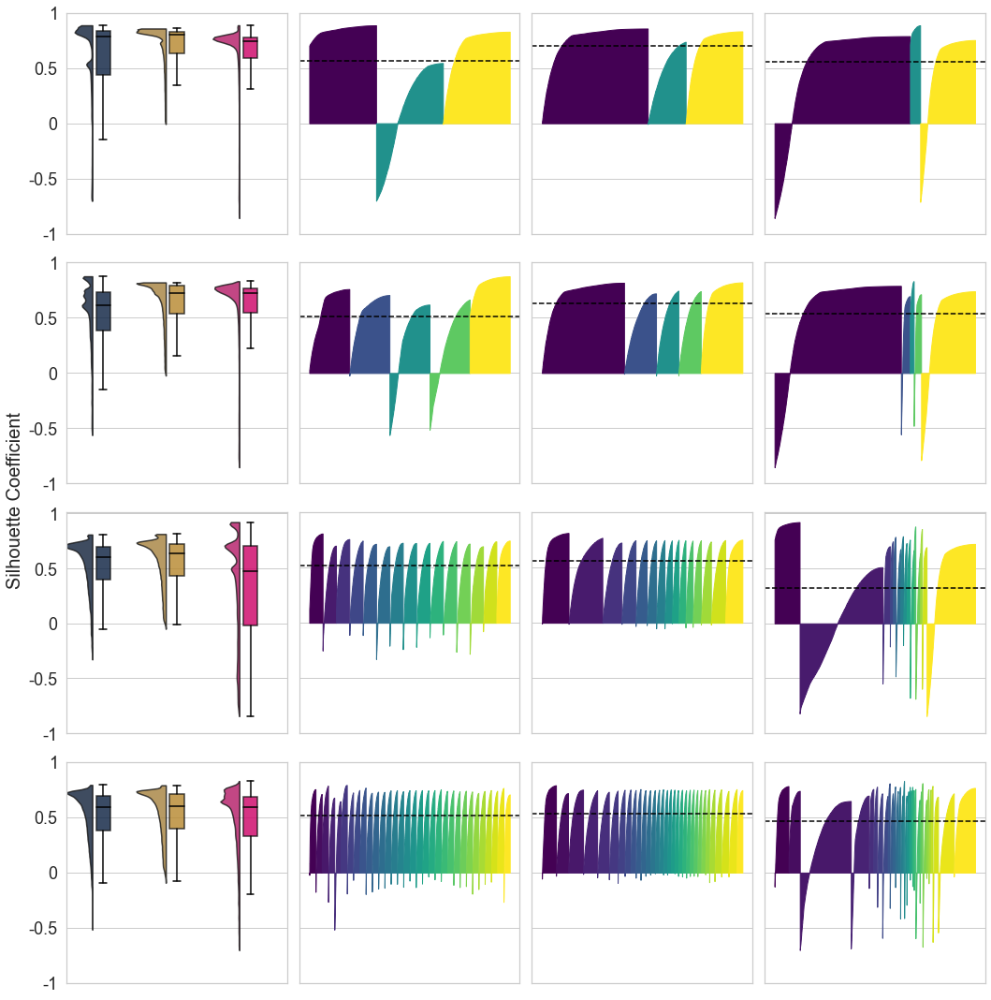

In [29]:
sns.set(style="whitegrid")
pal = ["#081E3F", "#B6862C", "#CC0066"]
ort = "v"
dy = "sample_scores"
dx = "segmentation"

fig, axes_tpl = plt.subplots(4, 4)
fig.set_size_inches(15, 15)
for segm_i, segment_size in enumerate([3, 5, 15, 32]):
    vio_axis = axes_tpl[segm_i, 0]

    for method_i, method in enumerate(["Percentile", "KMeans", "KDE"]):
        imb_axis = axes_tpl[segm_i, method_i + 1]
        # temp_axis = axes_tpl[method_i + 1]

        norm = plt.Normalize(0, segment_size-1)
        color = cm.get_cmap("viridis")
        y_lower = 10
        y_min, y_max = -1, 1
        for cluster_i in range(segment_size):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = samples_arrays[method_i][segment_size-3, labels_lst[method_i][segment_size-3] == cluster_i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            
            imb_axis.fill_between(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color(norm(cluster_i)),
                edgecolor=color(norm(cluster_i)),
                alpha=1,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            # imb_axis.text(-0.05, y_lower + 0.5 * size_cluster_i, str(cluster_i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        # y_min, y_max = np.max([samples_arrays[method_i][segm_i, :].min(), y_min]), np.min([samples_arrays[method_i][segm_i, :].max(), y_max])
        yticks = np.arange(-1, 1.5, 0.5)
        imb_axis.set_yticks(yticks)
        imb_axis.set_xticks([])  # Clear the yaxis labels / ticks
        imb_axis.axes.yaxis.set_ticklabels([])

        # The vertical line for average silhouette score of all the values
        imb_axis.axhline(y=silhouette_scores_df[method.lower()][segment_size-3], color="black", linestyle="--")

    pt.half_violinplot(
        x=dx,
        y=dy,
        data=violin_df[violin_df.segment_sizes == str(segment_size)],
        palette=pal,
        bw=0.05,
        cut=0.0,
        scale="area",
        width=0.8,
        dodge=False,
        inner=None,
        orient=ort,
        ax=vio_axis,
    )
    box_axe = sns.boxplot(
        x=dx,
        y=dy,
        data=violin_df[violin_df.segment_sizes == str(segment_size)],
        palette=pal,
        width=0.2,
        zorder=10,
        dodge=True,
        showcaps=True,
        showfliers=False,
        boxprops={"zorder": 9, "alpha": 0.8},
        whiskerprops={"color": "black", "zorder": 10},
        capprops={"color": "black", "zorder": 10},
        medianprops={"color": "black", "zorder": 10},
        saturation=1,
        orient=ort,
        ax=vio_axis,
    )
    plt.setp(box_axe.collections + box_axe.artists, alpha=0.8)
    # hue_order=hue_order,
    # order=hue_order,
    """
    for patch in box_axe.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set(color=(0, 0, 0, 1))
        patch.set(facecolor=(r, g, b, 0.8))
    for patch in box_axe.artists:
        r, g, b, a = patch.get_facecolor()
    
    # handles, labels = axe.get_legend_handles_labels()
    # ax.legend(handles=handles[0:3], labels=labels[0:3], loc="upper left")
    # ax.set_ylabel("Number of Bins")
    # ax.set_xlabel("Silhouette Coefficient")
    
    plt.suptitle(
        f"Silhouette analysis for {segment_size} segments",
        fontsize=20,
        fontweight="bold",
    )
    """
    vio_axis.set_ylabel("")
    vio_axis.set_xlabel("")
    vio_axis.set_yticks([-1, -0.5, 0, 0.5, 1])
    vio_axis.set_yticklabels([-1, -0.5, 0, 0.5, 1], fontsize=18)
    vio_axis.set_xticklabels([])

fig.supylabel("Silhouette Coefficient", fontsize=20)
fig.tight_layout()
fig.savefig(op.join(results_dir, "gradient_segmentation", "Figures", f"silhouette_samples.tiff"), bbox_inches="tight", dpi=1000)
plt.show()


## Visualize Confidence Maps

Confidence (silhouette) values for each vertex with respect to its assigned network is
visualized. Regions close to the boundaries between networks were less confident of their 
assignment. The best value is 1 and the worst value is -1. Values near 0 indicate overlapping 
clusters.


### Percentile

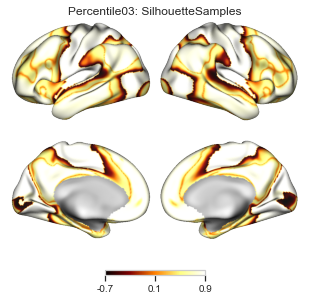

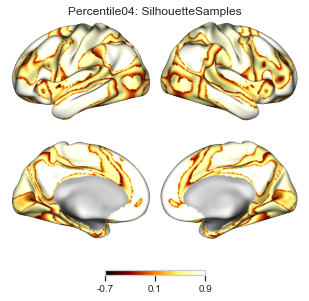

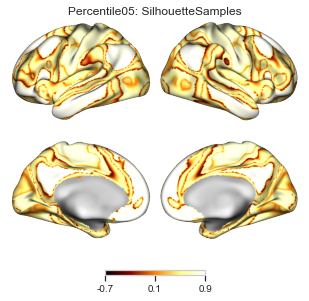

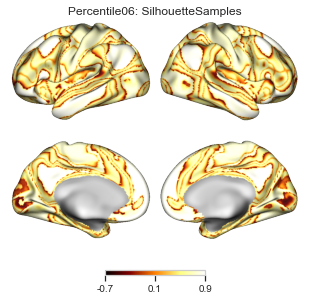

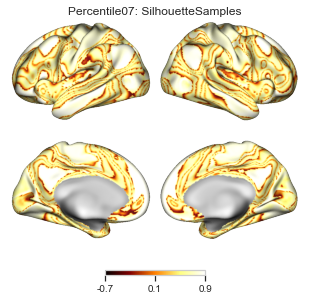

...

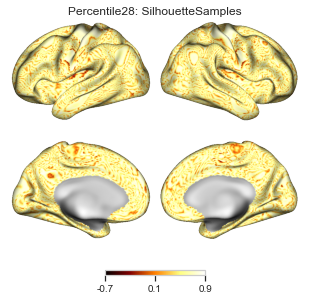

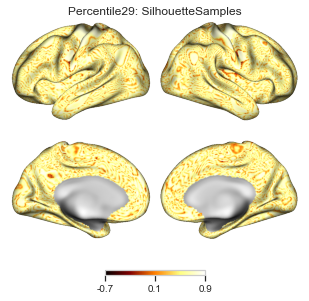

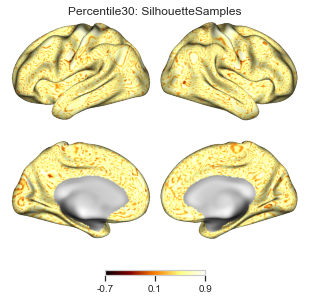

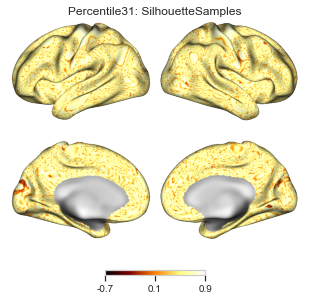

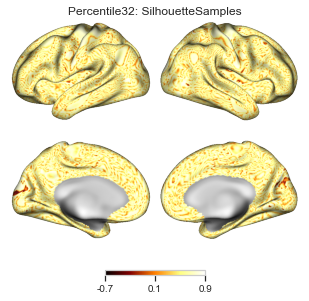

In [21]:
percentile_samples_seg_path = op.join(results_dir, "gradient_segmentation", "percentile")
percentile_samples_seg_lh_fnames = sorted(glob(op.join(percentile_samples_seg_path, "*desc-SilhouetteSamples_space-fsLR_den-32k_hemi-L_feature.func.gii")))
percentile_samples_seg_rh_fnames = sorted(glob(op.join(percentile_samples_seg_path, "*desc-SilhouetteSamples_space-fsLR_den-32k_hemi-R_feature.func.gii")))
percentile_samples_seg_fnames = zip(percentile_samples_seg_lh_fnames, percentile_samples_seg_rh_fnames)

plot_gradient(data_dir, percentile_samples_seg_fnames, cmap="afmhot", color_range=(-0.7,.9), out_dir=op.join(results_dir, "gradient_segmentation", "Figures"))

### KMeans

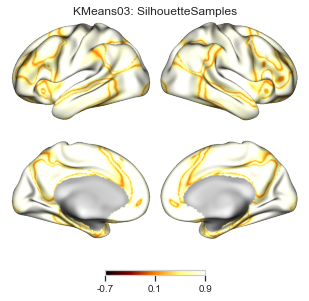

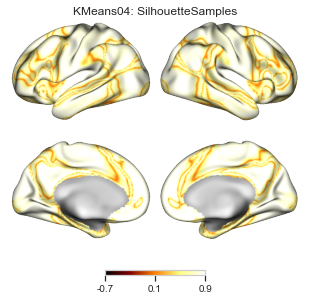

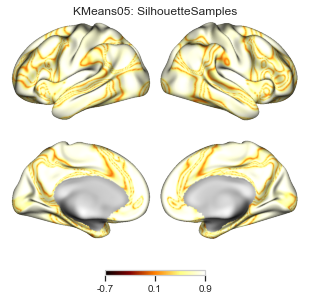

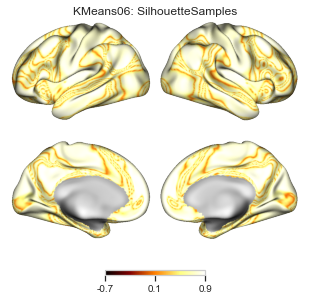

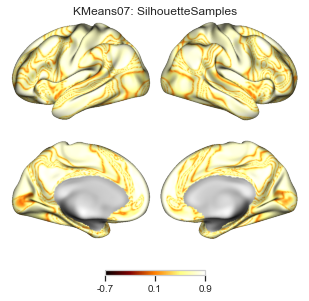

...

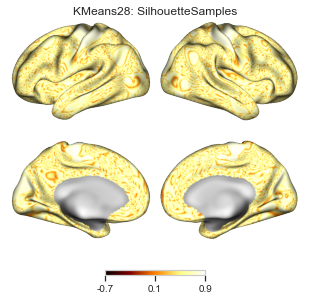

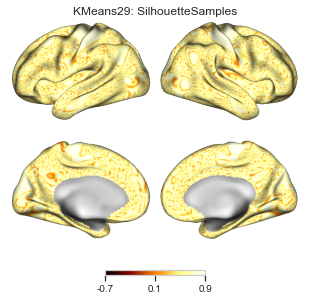

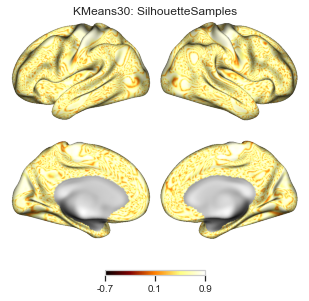

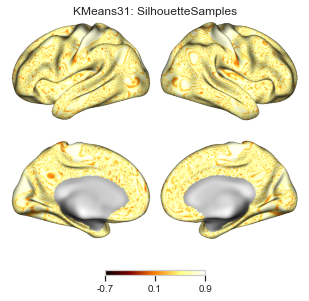

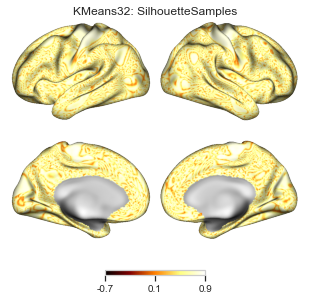

In [20]:
kmeans_samples_seg_path = op.join(results_dir, "gradient_segmentation", "kmeans")
kmeans_samples_seg_lh_fnames = sorted(glob(op.join(kmeans_samples_seg_path, "*desc-SilhouetteSamples_space-fsLR_den-32k_hemi-L_feature.func.gii")))
kmeans_samples_seg_rh_fnames = sorted(glob(op.join(kmeans_samples_seg_path, "*desc-SilhouetteSamples_space-fsLR_den-32k_hemi-R_feature.func.gii")))
kmeans_samples_seg_fnames = zip(kmeans_samples_seg_lh_fnames, kmeans_samples_seg_rh_fnames)

plot_gradient(data_dir, kmeans_samples_seg_fnames, cmap="afmhot", color_range=(-0.7,.9), out_dir=op.join(results_dir, "gradient_segmentation", "Figures"))

### KDE

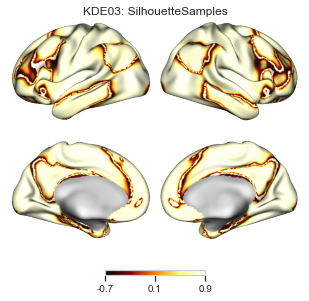

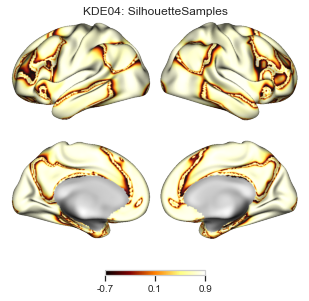

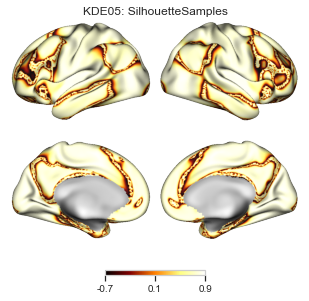

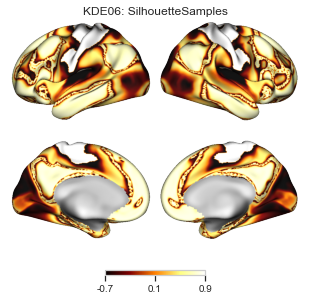

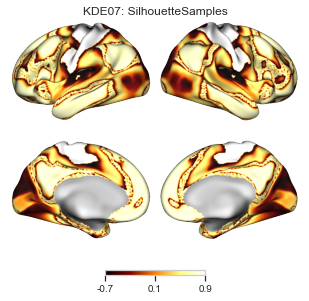

...

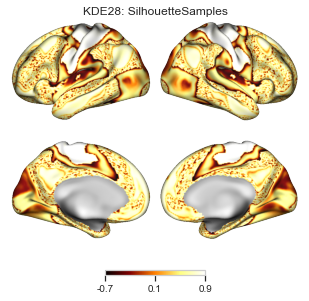

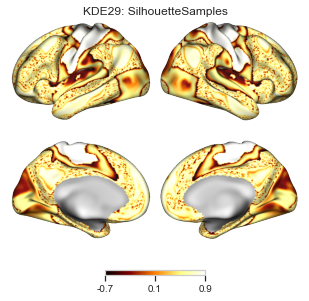

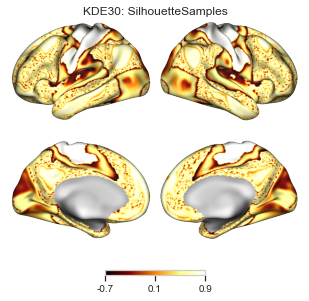

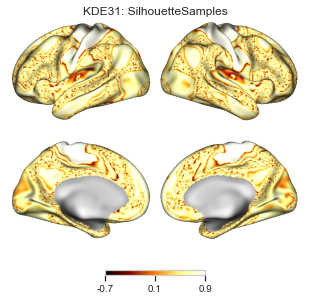

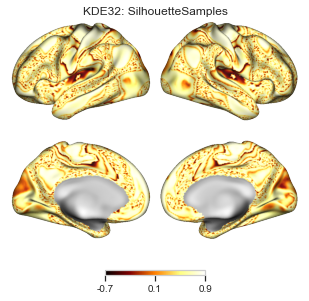

In [22]:
data_dir = "../data"

kde_samples_seg_path = op.join(results_dir, "gradient_segmentation", "kde")
kde_samples_seg_lh_fnames = sorted(glob(op.join(kde_samples_seg_path, "*desc-SilhouetteSamples_space-fsLR_den-32k_hemi-L_feature.func.gii")))
kde_samples_seg_rh_fnames = sorted(glob(op.join(kde_samples_seg_path, "*desc-SilhouetteSamples_space-fsLR_den-32k_hemi-R_feature.func.gii")))
kde_samples_seg_fnames = zip(kde_samples_seg_lh_fnames, kde_samples_seg_rh_fnames)

plot_gradient(data_dir, kde_samples_seg_fnames, cmap="afmhot", color_range=(-0.7,.9), out_dir=op.join(results_dir, "gradient_segmentation", "Figures"))